In [ ]:
# Cannabis vs. Weed vs. Marijuana vs. Pot
# Cannabis is actually a genus used in Health and Medical side
# Pot is Cannabis's leave, come from underground 
# Weed is not often used, means any undesired, uncultivated plant
# Marijuana is a new word to take a good side from Cannabis

In [1]:
with open('./twint/requirements.txt') as f:
    lines=f.readlines()
    lines[0]='aiohttp==3.7.0\n'
    f=open('./twint/requirements.txt','w')
for line in lines:
    f.write(line)
    f.close()

In [2]:
!more ./twint/requirements.txt

aiohttp==3.7.0
>t/requirements.txt (END)

In [4]:
!pip3 install ./twint/ -r ./twint/requirements.txt

Processing ./twint
  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.
  Created wheel for twint: filename=twint-2.1.21-py3-none-any.whl size=38869 sha256=f9c1b77e3f64c667a9ff8b43afdedbb2e89b21e8c82db677bfaf5ded5776b99a
  Stored in directory: /private/var/folders/fk/393w55_57ds3ql_6f1h8z2gm0000gn/T/pip-ephem-wheel-cache-y9tjhh17/wheels/22/b2/e0/f5c058f71baf8b202cbad7d72500036529f50170d5b96fccbf
Successfully built twint
  Attempting uninstall: twint
    Found existing installation: twint 2.1.21
    Uninstalling twint-2.1.21:
      Successfully uninstalled twint-2.1.21


In [5]:
!pip3 install nest_asyncio

In [ ]:
!pip install python-louvain

In [4]:
from community import community_louvain
from datetime import datetime, timedelta

import twint
import nest_asyncio
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import networkx.algorithms.community as nx_comm
import matplotlib.cm as cm

pd.set_option('display.max_colwidth', 120)

# Example

In [7]:
#@title 
keywords = "ธนาธร UTMB2022"

In [8]:
nest_asyncio.apply()
c = twint.Config()

c.Search = ' OR '.join(['"{}"'.format(word) for word in keywords.split()])
c.Retweets = True
c.Pandas = True
twint.run.Search(c)
output_df=twint.storage.panda.Tweets_df

1570492884314648576 2022-09-16 02:20:56 +0700 <bk_runfar> @Mathblanchard_ je viens d'écouter ton dernier podcast "dans mon bain": tu as fait rêver au moins 1 traileur amateur pendant 1h! J'ai l'impression d'avoir couru avec toi (ce qui serait bien sûr impossible 😅). Ce que tu as fait est juste incroyable un grand bravo!!! #utmb2022
1570353663989743616 2022-09-15 17:07:43 +0700 <ExploreNCA> [Nice Côte d'Azur by UTMB 🏃‍♂️] Rallier les sommets ⛰️de Nice Côte d'Azur à la Méditerranée 🌊 en participant au #NiceCotedAzurbyUTMB ... C'est encore possible ! Il reste quelques dossards 😉 Pour vous inscrire, c'est ici  👇 https://t.co/ov5LZS4Tst   #ExploreNiceCotedAzur #utmb2022  https://t.co/TAfDjBu6lx
1570337127388557312 2022-09-15 16:02:01 +0700 <UTMBMontBlanc> Sweet memories from the 🟩 #CCC! And we have one year to wait until the next one 🥹  Doux souvenirs de la 🟩 CCC ! Et nous avons un an à attendre avant la prochaine 🥹  🎥 @seracproductions  #UTMB2022 #UTMB #MeetYourExtraordinary  https://t.co/

KeyboardInterrupt: 

1567760135409340417 2022-09-08 13:21:58 +0700 <UTMBWorldSeries> 💥 Wherever They Race – Chapter 3 landed! 🎥 “UTMB 2022 – Believing in your dreams” Words are just not enough to describe the intensity of @UTMBMontBlanc.  🎬 Head to @compressport Youtube Channel and embrace the journey around Mont-Blanc:  https://t.co/BlCYvDn6xb  #UTMB2022  https://t.co/Wo7gukX6av
1567751667646447617 2022-09-08 12:48:19 +0700 <PiernsJP> OCC fotos vol 3 : Aterrizaje perfecto en #chamonix 😜  #occutmb2022 #utmbmontblanc #utmb2022 #nonaturenofuture #alpes #destinochamonix #instaitra en UTMB Mont-Blanc  https://t.co/SlAuVqZmew
1567743411083702272 2022-09-08 12:15:31 +0700 <nextbookbot> Build your Twitter integratio̖ns with #nocode ️  👉👉 https://t.co/N518FTJFko  #ctpolitics #eliyp #utmb2022 #thehemel100 #g4c #lebanese #rockmusic #hitsongs  https://t.co/bfo2VeXFDx
1567733102340100097 2022-09-08 11:34:33 +0700 <J_and_J4256_S> @MatichonTV ม็อปเขากำลังจะเดินหน้า แต่พอเจอตำตรวจ ขอตัวก่อนนะงับ อย่าว่าแต่เรื่องนำเลย จะเ

In [12]:
output_df.shape

(240, 38)

In [13]:
output_df.head(5)

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1567124378726572032,1567124378726572032,1.662467e+12,2022-09-06 19:15:42,+0700,,แต่หลังเลือกตั้งก็คงจะพูดอีกอย่าง 55555555 ตอน...,th,"[ธนาธร, ก้าวไกล, เพื่อไทย]",[],...,,,,,,[],,,,
1,1567119053470433281,1566955333616271362,1.662465e+12,2022-09-06 18:54:32,+0700,,@SubmarineTh #ธนาธร พูดแบบนี้ น่าจะเป็นกลยุทธ์...,th,"[ธนาธร, ก้าวไกล, เพื่อไทย]",[],...,,,,,,"[{'screen_name': 'SubmarineTh', 'name': 'ตังตั...",,,,
2,1567081067999526915,1567052655775854592,1.662456e+12,2022-09-06 16:23:36,+0700,,@svndw81 #ธนาธร พูดแบบนี้ น่าจะเป็นกลยุทธ์ทุบห...,th,"[ธนาธร, ก้าวไกล, เพื่อไทย, ข่าวการเมือง]",[],...,,,,,,"[{'screen_name': 'svndw81', 'name': 'ซึนซึน คน...",,,,
3,1567079236317618177,1566816674837581824,1.662456e+12,2022-09-06 16:16:19,+0700,,@Offchainon #ธนาธร พูดแบบนี้ น่าจะเป็นกลยุทธ์ท...,th,"[ธนาธร, ก้าวไกล, เพื่อไทย, ข่าวการเมือง]",[],...,,,,,,"[{'screen_name': 'Offchainon', 'name': 'OFF CH...",,,,
4,1567079159683481600,1567079159683481600,1.662456e+12,2022-09-06 16:16:01,+0700,,#ธนาธร พูดแบบนี้ น่าจะเป็นกลยุทธ์ทุบหม้อข้าวตี...,th,"[ธนาธร, ก้าวไกล, เพื่อไทย, ข่าวการเมือง]",[],...,,,,,,[],,,,


In [14]:
output_df['date']=pd.to_datetime(output_df['date'])+datetime.timedelta(hours=7)

In [15]:
output_df['only_date']=output_df['date'].dt.date

<AxesSubplot:xlabel='only_date'>

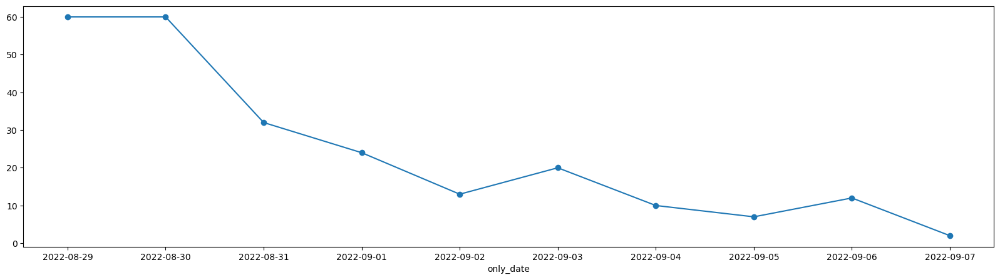

In [20]:
output_df.groupby('only_date').count()['id'].plot(style="-o", figsize=(20, 5))

<AxesSubplot:xlabel='only_date'>

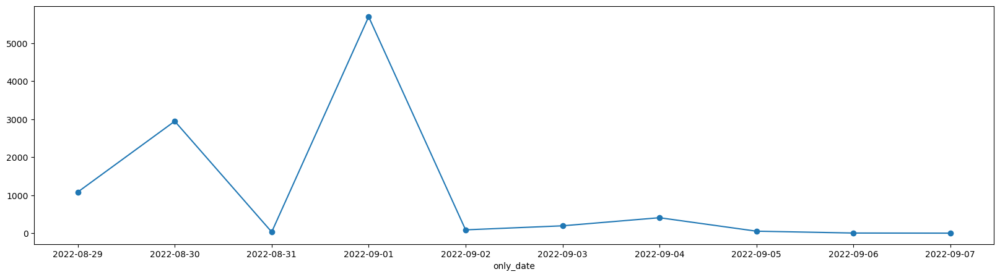

In [19]:
output_df.groupby('only_date').sum()['nretweets'].plot(style="-o", figsize=(20, 5))

<AxesSubplot:xlabel='username'>

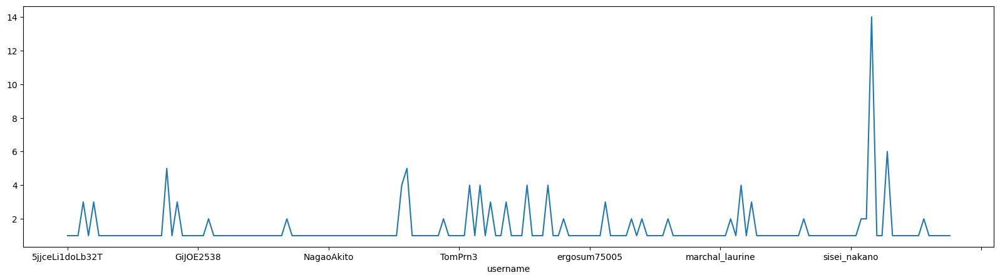

In [24]:
output_df.groupby('username').count()['id'].plot(figsize=(20, 5))

In [25]:
output_df.groupby('username').count()['id'].sort_values(ascending=False)

username
stopcredulity2     14
thanathorn101       6
ElLabDeJuan         5
Snoopy87348130      5
cacao_red           4
                   ..
RevistaTrailRun     1
RunEatStudy         1
Running_es          1
SPress24            1
zeze_two            1
Name: id, Length: 170, dtype: int64

In [27]:
c.Username = "stopcredulity2"
c.Search = ""
c.Pandas = True

# Run
twint.run.Search(c)
# twint.run.Profile(c)
user_twt=twint.storage.panda.Tweets_df

1567167857288675342 2022-09-06 22:08:28 +0700 <stopcredulity2> @Le24JZyt5AS7o8V ขี้ข้าเผด็จการไปไกลๆ ตีน
1567164206952370179 2022-09-06 21:53:58 +0700 <stopcredulity2> @naturecampanion 🦉 "Your mail from Hogwarts"
1567164138828480514 2022-09-06 21:53:41 +0700 <stopcredulity2> 🦉 "Your mail from Hogwarts"
1567154138429136897 2022-09-06 21:13:57 +0700 <stopcredulity2> #ก้าวไกล จะเปลี่ยนประเทศยังไง ในเมื่อไม่กล้าลงโทษคนในพรรคตัวเอง เวลาทำผิด ก็ไม่ยอมรับผิด พอมีคนแย้ง ก็บล็อกปิดปาก #ประชุมสภา #ก้าวไกลทั้งแผ่นดิน #ก้าวไกลnext  https://t.co/W7kyN8BEgP
1567143681198813184 2022-09-06 20:32:24 +0700 <stopcredulity2> เห็นรูปโปรไฟล์น้องพิมทีไร นึกว่าหมาใส่ชุดกงเต็กทุกที ใส่ไว้ทุกข์ให้เจ้าของล่วงหน้าเหรอจ๊ะ ? 😂😂😂
1567142623324028929 2022-09-06 20:28:12 +0700 <stopcredulity2> ก่อนที่ #ก้าวไกล จะขออาสาประชาชน #เปลี่ยนประเทศ ควรไปจัดการ2สก.#ล่วงละเมิดทางเพศ ในพรรคตัวเองก่อนไหม ? คดีคืบหน้าไปถึงไหนแล้ว ? หายเงียบไปเลยนะ หรือจะปล่อยเบลออีกแล้ว ? #ก้าวไกลทั้งแผ่นดิน #ข่าววันนี้ #ข่าวการเมือง
1567139703023

In [28]:
user_twt.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest'],
      dtype='object')

In [39]:
user_twt['date']=pd.to_datetime(user_twt['date'])

In [40]:
new_records=[]
for i,row in user_twt.iterrows():
    rec=dict()
    for tag in row['hashtags']:
        rec['date']=row['date']
        rec['nretweets']=row['nretweets']
        rec['hashtag']=tag
        new_records.append(rec)

In [41]:
hashtags_clean = [tag for tag in user_twt['hashtags'] if len(tag) != 0]

In [42]:
hashtag_df=pd.DataFrame(new_records)

In [43]:
hashtag_df['only_date']=hashtag_df['date'].dt.date

In [44]:
hashtag_df.hashtag.value_counts()[:20]

เพื่อไทย          97
ข่าวการเมือง      93
ข่าววันนี้        37
ประชุมสภา         24
ลูกพระจอม         21
อีแบกส้ม          12
กล้าพัฒนาชาติ     10
ก้าวไกลnext       10
ล้างหนี้กยศ        9
คุกคามทางเพศ       8
ประยุทธ์8ปี        8
รัฐประหาร          8
china              8
วิ่งแล้วรวย        8
บุพเพสันนิวาส๒     7
ก้าวไกล            7
นายกเถื่อน         6
ข่าวต่างประเทศ     6
ประวิตร            5
8ปีประยุทธ์        5
Name: hashtag, dtype: int64

In [45]:
show_df=hashtag_df.groupby(['only_date','hashtag']).count().reset_index()

In [46]:
cols=list(show_df.columns)
cols[2]='count'
show_df.columns=cols

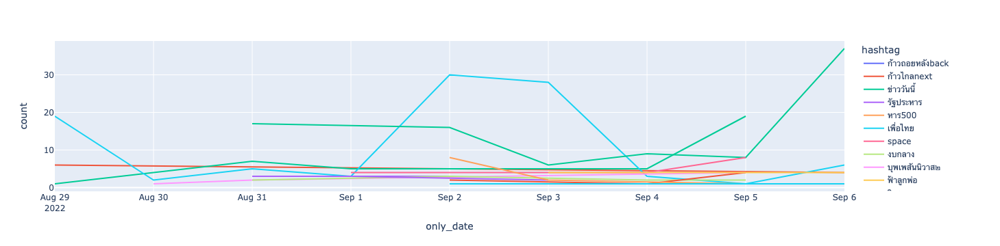

In [47]:
import plotly.express as px 

px.line(show_df,x='only_date',y='count',color='hashtag')

# Marijuana

In [9]:
keywords = "กัญชา กัญชากรุงเทพ"

In [10]:
nest_asyncio.apply

c.Search = ' OR '.join(['"{}"'.format(word) for word in keywords.split()])
c.Retweets = True
c.Pandas = True
twint.run.Search(c)
output_df=twint.storage.panda.Tweets_df

1571346428433412098 2022-09-18 10:52:37 +0700 <siamrath_online> "ปานเทพ" ร่ายยาวโต้ "สุทิน" พูดไม่หมด ยันกม.กัญชา กำหนดชัดเจนห้ามใช้ผิดประเภท มีโทษหนักจำคุก-ปรับ  https://t.co/Twug4ducn7 #สยามรัฐ #siamrathonline #สยามรัฐออนไลน์  #ข่าววันนี้
1571346077588267010 2022-09-18 10:51:13 +0700 <pppphrom> ช่วงนี้กัญชาเสรีอ่ะเนอะ ตกลงเทอสูบรึเสพอ่ะ รึตำแล้วชงดื่ม
1571345778135932931 2022-09-18 10:50:02 +0700 <siamflashnews> รัฐบาลแจงแม้ พ.ร.บ.กัญชาฯ ยังไม่มีผลบังคับ แต่มี กม.ควบคุม  https://t.co/pDdyxOMeUm
1571345681843097602 2022-09-18 10:49:39 +0700 <BudBoyseller> สวัสดีวันอาทิตย์ ร้านเปิดแล้วนะครับ LINE:  https://t.co/Ce6Gnb34aO #กัญชากรุงเทพ  #กัญชา  #กัญชาคลองสามวา  #กัญชารามอินทรา  #กัญชาog  #กัญชากรุงเทพ #กัญชานวมินทร์ #420th  #marijuanabangkok  #nawaminweed #raminthraweed #cannabisnawin #cannabisraninthra  https://t.co/WJNZENnUvM
1571345383254822912 2022-09-18 10:48:28 +0700 <O7pNTSz44tdNUHh> @AllaboutNewsth สนับสนุนให้ใช้กัญชาทางการแพทย์เท่านั้น
1571344749541625857 2022-09-18 10:45:57 +

In [11]:
output_df.shape

(8263, 38)

In [12]:
output_df.to_csv('marijuana_20220918.csv', encoding='utf-8', index=False)

In [13]:
!ls 

1_introduction.ipynb         marijuana_20220906.csv
2_alogorithm.ipynb           marijuana_20220918.csv
3_path.ipynb                 marijuana_notebook.ipynb
Network-Analysis-Made-Simple text-mining.ipynb
data.csv                     twint
intro_twint.ipynb


In [471]:
output_df=pd.read_csv('marijuana_20220906.csv')

In [472]:
output_df['date']=pd.to_datetime(output_df['date'])+datetime.timedelta(hours=7)
output_df['only_date']=output_df['date'].dt.date

<AxesSubplot:xlabel='only_date'>

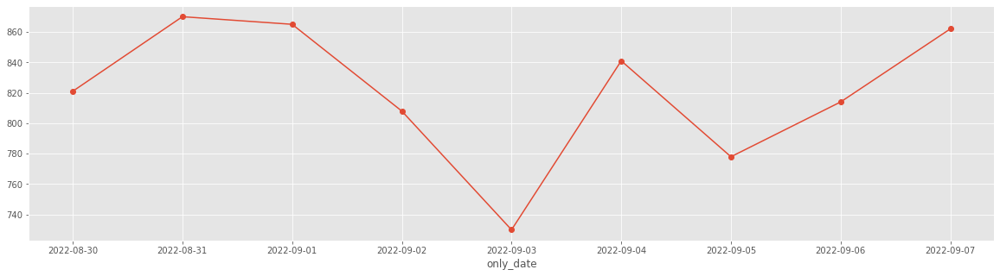

In [473]:
output_df.groupby('only_date').count()['id'].plot(style="-o", figsize=(20, 5))

<AxesSubplot:xlabel='only_date'>

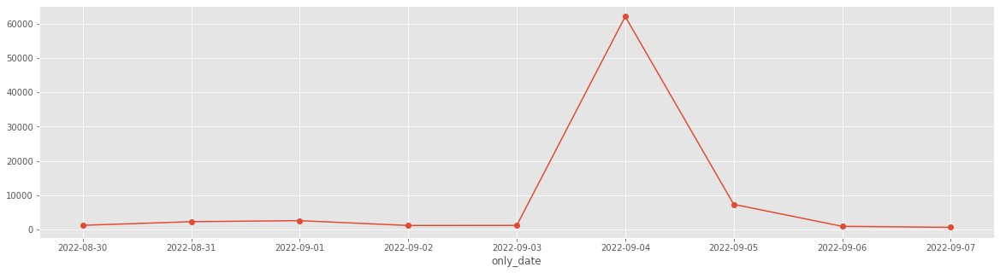

In [474]:
output_df.groupby('only_date').sum()['nretweets'].plot(style="-o", figsize=(20, 5))

<AxesSubplot:xlabel='username'>

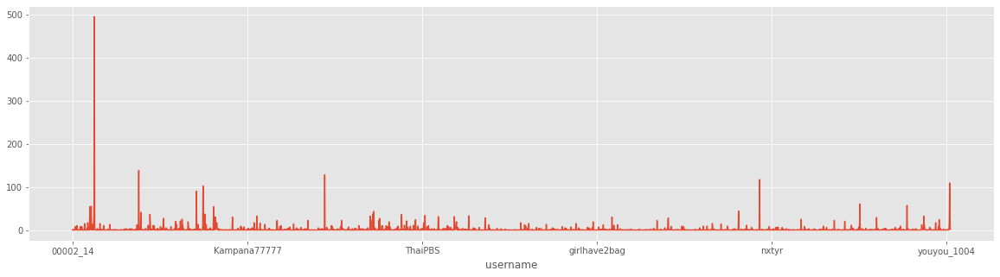

In [475]:
output_df.groupby('username').count()['id'].plot(figsize=(20, 5))

In [476]:
output_df.groupby('username').count()['id'].sort_values(ascending=False)

username
42xWeeD            495
BooK_Ku            139
OGGANJA2           129
nkx8yf4PxV8RccU    118
zoromonsS          110
                  ... 
ThenewXelfu          1
Themoon666420        1
Theben68             1
TheTopicFlow         1
baraya25038162       1
Name: id, Length: 2512, dtype: int64

In [477]:
output_df.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest', 'only_date'],
      dtype='object')

In [478]:
output_df.head(5)['user_id']

0    1535971169404276736
1     907097675144732672
2    1563270446216544260
3    1417488346109128718
4    1563270446216544260
Name: user_id, dtype: int64

In [479]:
# list of hashtag & related words

In [480]:
tags = [tag for tag in output_df['hashtags'] if len(tag)!=0]

In [481]:
# tags

In [482]:
import ast
x="['สยามรัฐ', 'siamrathonline', 'สยามรัฐออนไลน์', 'ข่าววันนี้']"
x=ast.literal_eval(x)
type(x)

list

In [483]:
import ast

tag_dict={}
for tag in tags:
    # fix 20220918: return to string representation as list
    tag=ast.literal_eval(tag)
    for name in tag:
        if name not in tag_dict:
            tag_dict[name] = 1
        else:
            tag_dict[name] = tag_dict[name]+1

In [484]:
# tag_dict

In [485]:
tag_df=pd.DataFrame(list(tag_dict.items()),columns=['tag_name','count'])

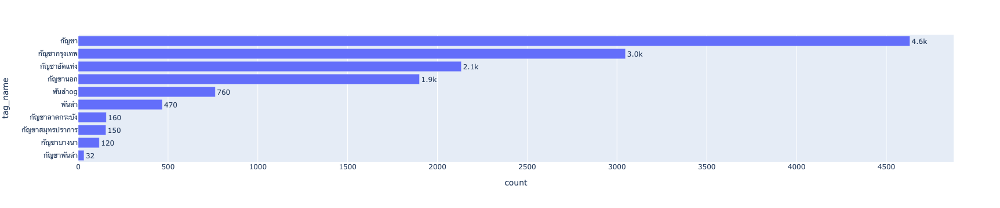

In [486]:
import plotly.express as px
fig = px.bar(tag_df[:10], y='tag_name', x='count', text='count')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide',yaxis={'categoryorder':'total ascending'})
fig.show()

In [487]:
output_df.columns

Index(['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place',
       'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str',
       'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video',
       'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url',
       'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt',
       'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src',
       'trans_dest', 'only_date'],
      dtype='object')

In [488]:
# create chart of user-tweet  

In [491]:
user_count=output_df.groupby(['username','user_id']).count()['id'].sort_values(ascending=False).reset_index(name='counts')

In [492]:
user_count.head(10)

,username,user_id,counts
0,42xWeeD,1554768110963478528,495
1,BooK_Ku,63018215,139
2,OGGANJA2,1552914113608970240,129
3,nkx8yf4PxV8RccU,1397569068652064770,118
4,zoromonsS,1454486461269434373,110
5,Greenglass_420,1557614780864536576,103
6,GUEST6607526277,1183085379202633728,91
7,smokequeen89,1551239508720422918,61
8,420weedog,1559885381654327297,60
9,tuatoh29,1536099003556696065,58


# Marijuana Agent

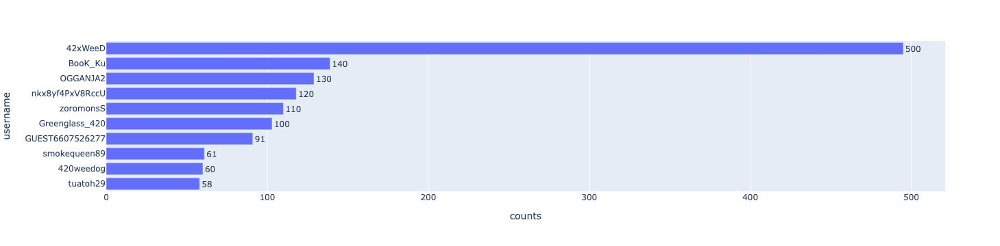

In [493]:
fig = px.bar(user_count[:10], y='username', x='counts', text='counts')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide',yaxis={'categoryorder':'total ascending'})
fig.show()

In [494]:
user_count.to_csv('marijuana_user_tweet_20220906.csv', encoding='utf-8', index=False)

In [119]:
# find follower of BigOne

In [120]:
c = twint.Config()
c.Username = "42xWeeD"
c.Limit = 100
c.Pandas = True
twint.run.Followers(c)
follow_df=twint.storage.panda.User_df

CRITICAL:root:twint.feed:Follow:IndexError


In [122]:
c.Username = "42xWeeD"
c.Search = ""
c.Pandas = True

twint.run.Search(c)
# twint.run.Profile(c)
user_twt=twint.storage.panda.Tweets_df

1571316405827670016 2022-09-18 08:53:19 +0700 <42xWeeD> PROMOTION เดือนกันยายน ‼️  ซื้อสินค้า 5,000฿ ขึ้นไปแถมดอกEXO 2G (สุ่มพันธุ์) 🙏🏼   กลุ่มเครดิต 💜🥦🙏🏼.  https://t.co/Jy4gjTNUu5  🚀..สั่งของติดต่อ.. 🚀  https://t.co/qm0aPxesrl  #กัญชา #กัญชาออแกนิค #กัญชากรุงเทพ #กัญชาเสรี #กัญชาog #กัญชารังสิต #กัญชานอก #กัญชากทม  #weed #พันลำ  https://t.co/u1VIvlUXA7
1571173849189978119 2022-09-17 23:26:51 +0700 <42xWeeD> PROMOTION เดือนกันยายน ‼️  ซื้อสินค้า 5,000฿ ขึ้นไปแถมดอกEXO 2G (สุ่มพันธุ์) 🙏🏼   กลุ่มเครดิต 💜🥦🙏🏼.  https://t.co/Jy4gjTNUu5  🚀..สั่งของติดต่อ.. 🚀  https://t.co/qm0aPxesrl  #กัญชา #กัญชาออแกนิค #กัญชากรุงเทพ #กัญชาเสรี #กัญชาog #กัญชารังสิต #กัญชานอก #กัญชากทม  #weed #พันลำ  https://t.co/vWbmEWyw0k
1571173798300487680 2022-09-17 23:26:39 +0700 <42xWeeD> BLUE DREAM ☁️✨ 1G / 350฿  1oz / 9,000฿  🚀..สั่งของติดต่อ.. 🚀  https://t.co/qm0aPxesrl  GRAB ❌ FLASH EXPREES ✅  #กัญชา #กัญชาออแกนิค #กัญชากรุงเทพ #กัญชาเสรี #กัญชาog #กัญชารังสิต #กัญชานอก #กัญชากทม #Dab  #กัญชาอัดแท่ง #กัญชาด้ายแดง

In [123]:
user_twt.head(10)

,id,conversation_id,created_at,date,timezone,place,tweet,language,hashtags,cashtags,...,geo,source,user_rt_id,user_rt,retweet_id,reply_to,retweet_date,translate,trans_src,trans_dest
0,1571316405827670016,1571316405827670016,1.663466e+12,2022-09-18 08:53:19,+0700,,"PROMOTION เดือนกันยายน ‼️ ซื้อสินค้า 5,000฿ ขึ้นไปแถมดอกEXO 2G (สุ่มพันธุ์) 🙏🏼 กลุ่มเครดิต 💜🥦🙏🏼. https://t.co/Jy...",th,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, weed, พันลำ]",[],...,,,,,,[],,,,
1,1571173849189978119,1571173849189978119,1.663432e+12,2022-09-17 23:26:51,+0700,,"PROMOTION เดือนกันยายน ‼️ ซื้อสินค้า 5,000฿ ขึ้นไปแถมดอกEXO 2G (สุ่มพันธุ์) 🙏🏼 กลุ่มเครดิต 💜🥦🙏🏼. https://t.co/Jy...",th,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, weed, พันลำ]",[],...,,,,,,[],,,,
2,1571173798300487680,1571173798300487680,1.663432e+12,2022-09-17 23:26:39,+0700,,"BLUE DREAM ☁️✨ 1G / 350฿ 1oz / 9,000฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB ❌ FLASH EXPREES ✅ #กัญช...",et,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,
3,1571173735071379457,1571173735071379457,1.663432e+12,2022-09-17 23:26:24,+0700,,"พันลำ BLUE DREAM ✨ 3มวล/900฿ 5มวล/1,500฿ 10มวล/2,500฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB ❌ FLASH ...",und,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,
4,1571173679375216641,1571173679375216641,1.663432e+12,2022-09-17 23:26:10,+0700,,"เศษดอก 🥦✨ 1oz / 1,300฿ 50G / 1,800฿ 100G / 3,490฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB ❌ FLASH EXP...",und,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,
5,1571173618230657024,1571173618230657024,1.663432e+12,2022-09-17 23:25:56,+0700,,"DAB 🌼✨ 1G / 850฿ 5G / 4,000฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB (IN BKK) ✅ FLASH EXPREES ✅ #กัญ...",et,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,
6,1571173532813656065,1571173532813656065,1.663432e+12,2022-09-17 23:25:35,+0700,,"SHATTER HASH 1G / 2,000฿ 5G / 9,000฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB (IN BKK) ✅ FLASH EXPREES ...",et,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,
7,1571173472528891905,1571173472528891905,1.663432e+12,2022-09-17 23:25:21,+0700,,"GREEN CACK/หางกระรอก/KDHY 🥦 PROMOTION ! 1KG / 6,500฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB ❌ FLASH ...",vi,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,
8,1571173411782799360,1571173411782799360,1.663432e+12,2022-09-17 23:25:07,+0700,,"ICE CREM CAKE 10G / 6,500฿ 1oz / 18,000฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB ❌ FLASH EXPREES ✅ #...",en,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,
9,1571173346364235777,1571173346364235777,1.663432e+12,2022-09-17 23:24:51,+0700,,"MAC#1 10G / 6,500฿ 1oz / 18,000฿ 🚀..สั่งของติดต่อ.. 🚀 https://t.co/qm0aPxesrl GRAB ❌ FLASH EXPREES ✅ #กัญชา #...",et,"[กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...",[],...,,,,,,[],,,,


In [124]:
user_twt['date']=pd.to_datetime(user_twt['date'])

In [125]:
user_twt['only_date']=user_twt['date'].dt.date

In [126]:
user_twt.shape

(100, 39)

In [127]:
print(user_twt.columns.tolist())

['id', 'conversation_id', 'created_at', 'date', 'timezone', 'place', 'tweet', 'language', 'hashtags', 'cashtags', 'user_id', 'user_id_str', 'username', 'name', 'day', 'hour', 'link', 'urls', 'photos', 'video', 'thumbnail', 'retweet', 'nlikes', 'nreplies', 'nretweets', 'quote_url', 'search', 'near', 'geo', 'source', 'user_rt_id', 'user_rt', 'retweet_id', 'reply_to', 'retweet_date', 'translate', 'trans_src', 'trans_dest', 'only_date']


In [128]:
# pd.set_option('display.max_colwidth', 120)

user_twt['hashtags'].head(5)

0                      [กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, weed, พันลำ]
1                      [กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, weed, พันลำ]
2    [กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...
3    [กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...
4    [กัญชา, กัญชาออแกนิค, กัญชากรุงเทพ, กัญชาเสรี, กัญชาog, กัญชารังสิต, กัญชานอก, กัญชากทม, dab, กัญชาอัดแท่ง, กัญชาด้า...
Name: hashtags, dtype: object

In [129]:
def to_tag_count_df(df):
    tags = [tag for tag in df['hashtags'] if len(tag)!=0]
    tag_dict={}
    for tag in tags:
        for word in tag: 
            if word not in tag_dict:
                tag_dict[word] = 1
            else:
                tag_dict[word] = tag_dict[word]+1
    return pd.DataFrame(list(tag_dict.items()),columns=['tag_name','count'])

In [130]:
tag_df=to_tag_count_df(user_twt)

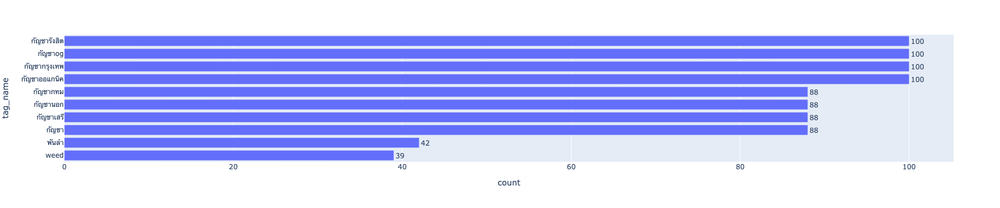

In [131]:
fig = px.bar(tag_df[:10], y='tag_name', x='count', text='count')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide',yaxis={'categoryorder':'total ascending'})
fig.show()

In [132]:
# px.line(tag_df,x='tag_name',y='count',color='tag_name')

In [133]:
new_records=[]
for i,row in user_twt.iterrows():
#     rec=dict()
    for tag in row['hashtags']:
        rec=dict()
        rec['date']=row['date']
        rec['nretweets']=row['nretweets']
        rec['hashtag']=tag
#         print(rec)
        new_records.append(rec)
#     print("---")

In [155]:
new_records[:10]

[{'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชา'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชาออแกนิค'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชากรุงเทพ'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชาเสรี'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชาog'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชารังสิต'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชานอก'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'กัญชากทม'},
 {'date': Timestamp('2022-09-18 08:53:19'), 'nretweets': 0, 'hashtag': 'weed'},
 {'date': Timestamp('2022-09-18 08:53:19'),
  'nretweets': 0,
  'hashtag': 'พันลำ'}]

In [135]:
hashtag_df=pd.DataFrame(new_records)

In [136]:
len(new_records)

1230

In [137]:
hashtag_df

,date,nretweets,hashtag
0,2022-09-18 08:53:19,0,กัญชา
1,2022-09-18 08:53:19,0,กัญชาออแกนิค
2,2022-09-18 08:53:19,0,กัญชากรุงเทพ
3,2022-09-18 08:53:19,0,กัญชาเสรี
4,2022-09-18 08:53:19,0,กัญชาog
...,...,...,...
1225,2022-09-16 18:47:49,0,กัญชากทม
1226,2022-09-16 18:47:49,0,กัญชาเสรี
1227,2022-09-16 18:47:49,0,กัญชาด้ายแดง
1228,2022-09-16 18:47:49,0,พันลํา


In [138]:
hashtag_df['only_date']=hashtag_df['date'].dt.date

In [139]:
hashtag_df.hashtag.value_counts()[:20]

กัญชากรุงเทพ      100
กัญชาog           100
กัญชารังสิต       100
กัญชาออแกนิค      100
กัญชาอัดแท่ง       93
กัญชาด้ายแดง       93
กัญชา              88
กัญชาเสรี          88
กัญชานอก           88
กัญชากทม           88
พันลําog           77
พันลํา             58
dab                52
พันลำ              42
weed               39
กัญชาเชียงใหม่     20
คีฟ                 4
Name: hashtag, dtype: int64

In [140]:
hashtag_df

,date,nretweets,hashtag,only_date
0,2022-09-18 08:53:19,0,กัญชา,2022-09-18
1,2022-09-18 08:53:19,0,กัญชาออแกนิค,2022-09-18
2,2022-09-18 08:53:19,0,กัญชากรุงเทพ,2022-09-18
3,2022-09-18 08:53:19,0,กัญชาเสรี,2022-09-18
4,2022-09-18 08:53:19,0,กัญชาog,2022-09-18
...,...,...,...,...
1225,2022-09-16 18:47:49,0,กัญชากทม,2022-09-16
1226,2022-09-16 18:47:49,0,กัญชาเสรี,2022-09-16
1227,2022-09-16 18:47:49,0,กัญชาด้ายแดง,2022-09-16
1228,2022-09-16 18:47:49,0,พันลํา,2022-09-16


In [141]:
show_df=hashtag_df.groupby(['only_date','hashtag']).count().reset_index()

In [142]:
cols=list(show_df.columns)
cols[2]='count'
show_df.columns=cols

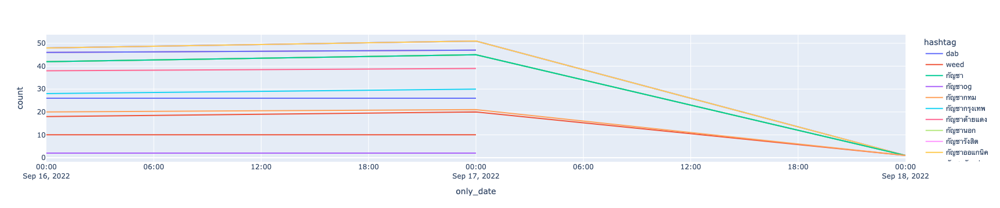

In [143]:
px.line(show_df,x='only_date',y='count',color='hashtag')

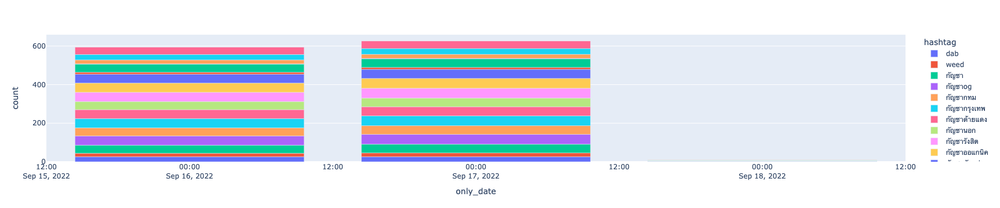

In [144]:
px.bar(show_df, x='only_date', y='count', color='hashtag')

# Sentiment Analysis

In [145]:
# thai_sentiment
# https://github.com/cstorm125/thai_sentiment

In [146]:
!pip install thai-sentiment

  Using cached thai_sentiment-0.1.3-py3-none-any.whl
  Using cached sklearn-0.0-py2.py3-none-any.whl
  Using cached pythainlp-3.0.9-py3-none-any.whl (11.5 MB)
  Using cached tinydb-4.7.0-py3-none-any.whl (24 kB)


In [147]:
!pip install torch emoji

  Using cached torch-1.12.1-cp39-none-macosx_11_0_arm64.whl (49.1 MB)
     |████████████████████████████████| 216 kB 1.7 MB/s eta 0:00:01
  Created wheel for emoji: filename=emoji-2.1.0-py3-none-any.whl size=212392 sha256=7d2407b92696a7bb53b151fd2ab0abcca6ef0935418b57e136eaf7a062d57a25
  Stored in directory: /Users/prachy/Library/Caches/pip/wheels/b0/4a/c8/9c580a0ea94dea641b8023456a1b178a7e4509d992224ed4aa
Successfully built emoji


In [148]:
from thai_sentiment import get_sentiment

/Users/prachy/opt/miniconda3/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html

/Users/prachy/opt/miniconda3/lib/python3.9/site-packages/sklearn/base.py:329: UserWarning:

Trying to unpickle estimator TfidfTransformer from version 0.24.1 when using version 1.1.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/Users/prachy/opt/miniconda3/lib/python3.9/site-packages/sklearn/base.py:329: UserWarning:

Trying to unpickle estimator TfidfVectorizer from version 0.24.1 when using version 1.1.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/Users/prachy/opt/min

In [149]:
get_sentiment('ร้านนี้อาหารอย่างแย่')

('neg',
 {'pos': 0.07848318054147058,
  'neu': 0.28609131356977374,
  'neg': 0.3279735800256706})

In [150]:
get_sentiment('ร้านนี้อยู่บางรัก')

('neu',
 {'pos': 0.23328174158421325,
  'neu': 0.6859672540205807,
  'neg': 0.024412368023402797})

In [151]:
get_sentiment('ร้านนี้อยู่บางรัก')

('neu',
 {'pos': 0.23328174158421325,
  'neu': 0.6859672540205807,
  'neg': 0.024412368023402797})

In [152]:
text1="กัญชาแม่งดีจัด"
text2="กัญชาดี"
text3="กัญชาการแพทย์"
text4="กัญชาเป็นยาเสพติด"
text5="ติดกัญชา"
text6="กัญชาเป็นโทษ"
text7="กัญชาอันตราย"
text8="อันตรายจากกัญชา"
text9="กัญชาแย่"
text10="กัญชาตาย"
text11="กัญชาไม่ดี"
text12="กัญชาผ่อนคลาย"

texts = [text1,text2,text3,text4,text5,text6,text7,text8,text9,text10,text11,text12]

In [153]:
translate = {'neg':'negative','pos':'positive','neu':'neutral'}

In [154]:
for idx, text in enumerate(texts, start=1):
    res = get_sentiment(text)
    print("result for text{}: \'{}\' = \'{}\'".format(idx, text, translate[res[0]]))

result for text1: 'กัญชาแม่งดีจัด' = 'negative'
result for text2: 'กัญชาดี' = 'neutral'
result for text3: 'กัญชาการแพทย์' = 'neutral'
result for text4: 'กัญชาเป็นยาเสพติด' = 'neutral'
result for text5: 'ติดกัญชา' = 'neutral'
result for text6: 'กัญชาเป็นโทษ' = 'neutral'
result for text7: 'กัญชาอันตราย' = 'neutral'
result for text8: 'อันตรายจากกัญชา' = 'neutral'
result for text9: 'กัญชาแย่' = 'negative'
result for text10: 'กัญชาตาย' = 'neutral'
result for text11: 'กัญชาไม่ดี' = 'negative'
result for text12: 'กัญชาผ่อนคลาย' = 'neutral'


# Tweepy

In [1]:
!pip install tweepy

In [196]:
import tweepy

token='AAAAAAAAAAAAAAAAAAAAAPJdgwEAAAAA0rgkNV3aWuAlDEFYTmFBg%2BOuKIo%3DEcCQd5lAJ6bRCSGIWW0Yog6WRJmTFjPx32rPZhAk8dRcfQQxzo'
client=tweepy.Client(token)

### User

In [5]:
user = client.get_user(username='RangsimanRome')

In [6]:
user.data

<User id=113415683 name=Rangsiman Rome username=RangsimanRome>

In [7]:
user.data.id

113415683

In [8]:
!ls

1_introduction.ipynb              marijuana_20220906.csv
2_alogorithm.ipynb                marijuana_20220918.csv
3_path.ipynb                      marijuana_notebook.ipynb
Network-Analysis-Made-Simple      marijuana_user_tweet_20220906.csv
data.csv                          marijuana_user_tweet_20220918.csv
follower_dataset.csv              text-mining.ipynb
follower_dataset.numbers          twint
intro_twint.ipynb                 twitterFollowers.png


In [9]:
users=pd.read_csv('marijuana_user_tweet_20220906.csv')

In [10]:
users.head(5)

,username,user_id,counts
0,42xWeeD,1554768110963478528,495
1,BooK_Ku,63018215,139
2,OGGANJA2,1552914113608970240,129
3,nkx8yf4PxV8RccU,1397569068652064770,118
4,zoromonsS,1454486461269434373,110


In [11]:
users[users['username']=='The_Stoned_Yoda']

,username,user_id,counts


In [12]:
# users.values.tolist()

In [13]:
users_list=users.values.tolist()

### Follower

In [14]:
follower = client.get_users_followers(id=113415683, user_fields=['location','description','username'], expansions=['pinned_tweet_id'])

In [15]:
follower.data[:10]

[<User id=1571841663437516802 name=ศุภฤกษ์ ศิลาถาวรมงคล username=uphvksilthwrmn1>,
 <User id=1534862015897817089 name=Rambo Rambo username=kanyanat336>,
 <User id=1571838767811694593 name=orawan nuchan username=NuchanOrawan>,
 <User id=1242052393325309952 name=Nitaya Chaocharoen username=NitayaChaochar1>,
 <User id=1571826941975744512 name=คนสวยของน้อนแบม😍 username=kaebambam7>,
 <User id=1571814264809357312 name=ความทรงจำ สีจางๆ username=pongsuk77>,
 <User id=1571824698841010176 name=อๅจง username=xcng36156121>,
 <User id=1569240806413971456 name=Nattarin username=Nattari72519839>,
 <User id=1570184195389161473 name=Napha username=Napha_2002>,
 <User id=1226339768725721089 name=sunday username=sundaywestie>]

In [16]:
follower.includes

{'tweets': [<Tweet id=1571822448655601664 text='ทักมาคุยมาสอบถามได้นะค้ะ\nรับงานนอกสถานที่ ขายคลิป\nงานไฮ❄️❄️แบ่งกันได้นะค้ะ \nรอบๆนนทบุรีส่งด่วนให้ค้ะ\nG 1200 เยอะขึ้นถูกลงค่ะ\nตัวเล็ก น้อยกว่านี้ไม่ขายนะค้ะ\n30 1650\n1 ถุง 4500\n#ตัวเล็ก #ยาม้า #ยาบ้า #สายดีด #ยาดีด #สายไฮ #ตัวใหญ่ #ไฮลอย #hicool #สายควัน https://t.co/njrS6sxg3k'>,
  <Tweet id=1571192011784613888 text='⭐️ ดูดวงฟรีมาเเล้วๆ เเบบไม่ค่อยละเอียด\n\U0001faac ดูดวงตามศรัทธา คือ เเบบละเอียดค้าบ เสียตังตามใจเลยค้าบ \n- กติกา ฟอล รีทวิต รีวิวด้วยน้า \n- ขอคำถามเจาะจงนะคะ \nได้ทุกคิวเเน่นอน ถ้าอยากโดเนทจะดูให้ละเอียดเลยค้าบ #ดูดวงฟรี #ดูดวง #ดูดวงการเรียน  #ดูดวงความรัก #ดูดวงไพ่ทาโร่'>,
  <Tweet id=1133755345724010496 text='จารึกเอาไว้ https://t.co/NkY7lZHufV'>,
  <Tweet id=1570373168656953344 text='พัฒนาที่ดินเขาใหญ่ ตรงข้ามโรงเรียนเขาใหญ่พิทยาคม https://t.co/MYvI1ViNSa'>]}

In [17]:
for f in follower[0][:10]:
    location = f.data.get('location')
    description = f.data.get('description')
    print("user: {}-{} live in: {}".format(f.data.get('id'),f.data.get('username'), location))

user: 1571841663437516802-uphvksilthwrmn1 live in: None
user: 1534862015897817089-kanyanat336 live in: None
user: 1571838767811694593-NuchanOrawan live in: None
user: 1242052393325309952-NitayaChaochar1 live in: None
user: 1571826941975744512-kaebambam7 live in: None
user: 1571814264809357312-pongsuk77 live in: None
user: 1571824698841010176-xcng36156121 live in: None
user: 1569240806413971456-Nattari72519839 live in: None
user: 1570184195389161473-Napha_2002 live in: None
user: 1226339768725721089-sundaywestie live in: None


### List's follower (not user)

In [18]:
top5_user_ids=[str(user[1]) for user in users_list][:5]

In [19]:
# for i in top5_user_ids:
#     print(type(i))

In [20]:
top5_user_ids

['1554768110963478528',
 '63018215',
 '1552914113608970240',
 '1397569068652064770',
 '1454486461269434373']

In [21]:
# client.get_list_followers(id=['1554768110963478528'],max_results=2)

### User's Follower

In [22]:
# user_id = 2244994945

# By default, only the ID, name, and username fields of each user will be
# returned
# Additional fields can be retrieved using the user_fields parameter
# response = client.get_users_followers(user_id, user_fields=['location','description','username'], expansions=['pinned_tweet_id'])

# for user in response.data:
#     print(user.username, user.profile_image_url)

# # By default, this endpoint/method returns 100 results
# # You can retrieve up to 1000 users by specifying max_results
# response = client.get_users_followers(user_id, max_results=1000)

In [215]:
# users_list

In [24]:
# tier1
user_follower=[]
for user in users_list[:10]:
    user_name = user[0]
    user_id = user[1]
    # print(user_name)
    # print(user_id)
    response = client.get_users_followers(user_id, 
                                          user_fields=['location','description','username'], 
                                          expansions=['pinned_tweet_id'],
                                          max_results=200)
    for follower in response.data:
        location = follower.data.get('location')
        description = follower.data.get('description')
        # print("user: {}, name:{} live: {} desc:{}".format(follower.data.get('id'), follower.data.get('username'), location, description))
        # user_id, user_name, follower_id, follower_name
        user_follower.append([user_id, user_name, follower.data.get('username'), follower.data.get('id'), location, description])

    print("end of main user: {}".format(user[0]))

end of main user: 42xWeeD
end of main user: BooK_Ku
end of main user: OGGANJA2
end of main user: nkx8yf4PxV8RccU
end of main user: zoromonsS
end of main user: Greenglass_420
end of main user: GUEST6607526277
end of main user: smokequeen89
end of main user: 420weedog
end of main user: tuatoh29


In [26]:
folowers_data=user_follower.copy()

In [230]:
len(folowers_data)

1308

In [232]:
df = pd.DataFrame(folowers_data, columns=['source_id','source_name','follower_name','follower_id','location','description'])
df.to_csv('all_follower_tier1.csv', encoding='utf-8', index=False)

In [181]:
df.groupby(['source_id','source_name']).size()

source_id            source_name    
63018215             BooK_Ku            210
1183085379202633728  GUEST6607526277    200
1397569068652064770  nkx8yf4PxV8RccU    210
1454486461269434373  zoromonsS           36
1536099003556696065  tuatoh29           200
1551239508720422918  smokequeen89       200
1552914113608970240  OGGANJA2            66
1554768110963478528  42xWeeD             75
1557614780864536576  Greenglass_420      67
1559885381654327297  420weedog           84
dtype: int64

In [182]:
sample_follower_tier2=df.groupby(['source_id','source_name']).apply(lambda x: x.sample(20)).reset_index(drop=True)

In [183]:
sample_follower_tier2.loc[sample_follower_tier2['source_name'] == '42xWeeD'].shape

(20, 6)

In [184]:
sample_follower_tier2[['source_id','source_name','follower_id','follower_name']]

,source_id,source_name,follower_id,follower_name
0,63018215,BooK_Ku,1257686838401052675,Tv2W6F9ihmPhKwt
1,63018215,BooK_Ku,1540312630560432128,mao_dok01
2,63018215,BooK_Ku,1361883029648535553,tyguuhbvnji
3,63018215,BooK_Ku,1420609551955415048,KHUNNuT12379306
4,63018215,BooK_Ku,1523635729544658945,permcha77445101
...,...,...,...,...
195,1559885381654327297,420weedog,1400113076632911873,Bat74054248
196,1559885381654327297,420weedog,1395716230963621893,Kasidis15369
197,1559885381654327297,420weedog,1406265474074103812,KK59173048
198,1559885381654327297,420weedog,1348282458807148545,senelux1


In [189]:
for index, row in sample_follower_tier2[['follower_id','follower_name']][:10].iterrows():
    user_name = row['follower_name']
    user_id = row['follower_id']
    print(user_name, user_id)

Tv2W6F9ihmPhKwt 1257686838401052675
mao_dok01 1540312630560432128
tyguuhbvnji 1361883029648535553
KHUNNuT12379306 1420609551955415048
permcha77445101 1523635729544658945
FreedomSatob 1203938105012543490
NittyaYingyong 1433097068378132483
Thailand2590 1506127375108820994
08063MWnvndDs5e 1475393039820488705
SkSkg20 1430764549209157634


In [190]:
sample_follower_tier2[['follower_id','follower_name']][0:10]

,follower_id,follower_name
0,1257686838401052675,Tv2W6F9ihmPhKwt
1,1540312630560432128,mao_dok01
2,1361883029648535553,tyguuhbvnji
3,1420609551955415048,KHUNNuT12379306
4,1523635729544658945,permcha77445101
5,1203938105012543490,FreedomSatob
6,1433097068378132483,NittyaYingyong
7,1506127375108820994,Thailand2590
8,1475393039820488705,08063MWnvndDs5e
9,1430764549209157634,SkSkg20


### Gathering

In [199]:
# tier1
import time
for i in range(0, 200, 10):
    start=i
    end=i+10
    # print(start,end)
    user_follower_tier2=[]
    for index, row in sample_follower_tier2[['follower_id','follower_name']][start:end].iterrows():
        user_name = row['follower_name']
        user_id = row['follower_id']

        response = client.get_users_followers(user_id, 
                                              user_fields=['location','description','username'], 
                                              expansions=['pinned_tweet_id'],
                                              max_results=200)
        try:
            for follower in response.data:
                location = follower.data.get('location')
                description = follower.data.get('description')
                # print("user: {}, name:{} live: {} desc:{}".format(follower.data.get('id'), follower.data.get('username'), location, description))
                # user_id, user_name, follower_id, follower_name
                user_follower_tier2.append([user_id, user_name, follower.data.get('username'), follower.data.get('id'), location, description])
        except Exception as e:
            print(e)
            pass
        print("end of main user: {}".format(user_name))
        
    df = pd.DataFrame(user_follower_tier2, columns=['source_id','source_name','follower_name','follower_id','location','description'])
    df.to_csv('user_follower_tier2_{}.csv'.format(i), encoding='utf-8', index=False)
    print("end of batch:#{}".format(i))
    time.sleep(60*15)

end of main user: Tv2W6F9ihmPhKwt
end of main user: mao_dok01
'NoneType' object is not iterable
end of main user: tyguuhbvnji
end of main user: KHUNNuT12379306
'NoneType' object is not iterable
end of main user: permcha77445101
end of main user: FreedomSatob
end of main user: NittyaYingyong
end of main user: Thailand2590
end of main user: 08063MWnvndDs5e
end of main user: SkSkg20
end of batch:#0
end of main user: AussadawutR
end of main user: 8fNf2ktyqnxAxte
end of main user: WangmanowOg
end of main user: mickcobain
'NoneType' object is not iterable
end of main user: thirpha00028077
end of main user: FHWOfBnUoKuCiG7
end of main user: tacheychey02
end of main user: khaykay3
'NoneType' object is not iterable
end of main user: Gravity12827
'NoneType' object is not iterable
end of main user: dneedneednee
end of batch:#10
end of main user: Haroon2522
end of main user: JunaidiPungki
end of main user: paphonm12
end of main user: Qin2022731
end of main user: REALOG420TH
end of main user: plych

In [174]:
len(user_follower_tier2)

821

In [175]:
df = pd.DataFrame(user_follower_tier2, columns=['source_id','source_name','follower_name','follower_id','location','description'])
df.head()

,source_id,source_name,follower_name,follower_id,location,description
0,1418211358869393422,Lordo57043824,Luna46702587,1560463753749364737,None,
1,1418211358869393422,Lordo57043824,JinovelOfficial,1493436394500681733,Thailand,🏮ยินดีต้อนรับคุณท่านเข้าสู่ตำหนักJINOVELเจ้าค่ะ🏮 \nเพลิดเพลินไปกับนิยายแปลถูกลิขสิทธิ์ เต็มอิ่มไปกับความสนุกที่เราคั...
2,1418211358869393422,Lordo57043824,Kawebookdotcom,1196677370310037504,Thailand,🍀แหล่งรวมนิยายแปลจีนถูกลิขสิทธิ์🍀\n💚ไม่ว่าคุณจะชอบอ่านนิยายจีนแนวไหนให้ kawebook เป็นคำตอบของคุณ สนุก อ่านเพลิน ครบท...
3,1418211358869393422,Lordo57043824,ward_danielle31,1535411341548199939,Arlington,
4,1418211358869393422,Lordo57043824,porter85brenda,1548410723142799360,Lewisville,


In [178]:
df.to_csv('user_follower_tier2_{}.csv'.format(i), encoding='utf-8', index=False)

In [509]:
df = pd.DataFrame(user_follower, columns=['source','target'])
df.head()

,source,target
0,1554768110963478528,1351745154344919042
1,1554768110963478528,1417122611482427395
2,1554768110963478528,1568813694355918848
3,1554768110963478528,1571090237526536193
4,1554768110963478528,1567343778855546880


## merge

In [201]:
!ls ./

1_introduction.ipynb              user_follower_tier2_100.csv
2_alogorithm.ipynb                user_follower_tier2_110.csv
3_path.ipynb                      user_follower_tier2_120.csv
Network-Analysis-Made-Simple      user_follower_tier2_130.csv
data.csv                          user_follower_tier2_140.csv
follower_dataset.csv              user_follower_tier2_150.csv
follower_dataset.numbers          user_follower_tier2_160.csv
intro_twint.ipynb                 user_follower_tier2_170.csv
marijuana_20220906.csv            user_follower_tier2_180.csv
marijuana_20220918.csv            user_follower_tier2_190.csv
marijuana_notebook.ipynb          user_follower_tier2_20.csv
marijuana_user_tweet_20220906.csv user_follower_tier2_30.csv
marijuana_user_tweet_20220918.csv user_follower_tier2_40.csv
text-mining.ipynb                 user_follower_tier2_50.csv
twint                             user_follower_tier2_60.csv
twitterFollowers.png              user_follower_tier2_70.csv
user_follower_

In [208]:
import pandas as pd
import glob
import os

path = './' 
all_files = glob.glob(os.path.join(path , "user_follower_tier2*.csv"))

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)

In [217]:
frame.to_csv('all_follower_tier2.csv', encoding='utf-8', index=False)

In [233]:
# pd.read_csv('all_follower_tier2.csv', index_col=None, header=0)

In [236]:
merge_df=pd.concat([pd.read_csv('all_follower_tier1.csv', index_col=None, header=0), pd.read_csv('all_follower_tier2.csv', index_col=None, header=0)], axis=0, ignore_index=True)l

In [237]:
merge_df.to_csv('follower_network.csv', encoding='utf-8', index=False)

In [238]:
merge_df.head()

,source_id,source_name,follower_name,follower_id,location,description
0,1554768110963478528,42xWeeD,C9xMggNjYe4e6GI,1396605027532238848,NaN,NaN
1,1554768110963478528,42xWeeD,Benz23625920,1351745154344919042,NaN,NaN
2,1554768110963478528,42xWeeD,Doy1237,1417122611482427395,NaN,NaN
3,1554768110963478528,42xWeeD,HighBerHerb420,1568813694355918848,"Bangkok, Thailand","Cannabis shop \nExotic, Top-shelf, mid-grade,low-grade\nส่ง+50฿"
4,1554768110963478528,42xWeeD,phlab_thxng,1571090237526536193,NaN,NaN


In [510]:
G = nx.from_pandas_edgelist(df, 'source', 'target') #Turn df into graph
pos = nx.spring_layout(G) #specify layout for visual

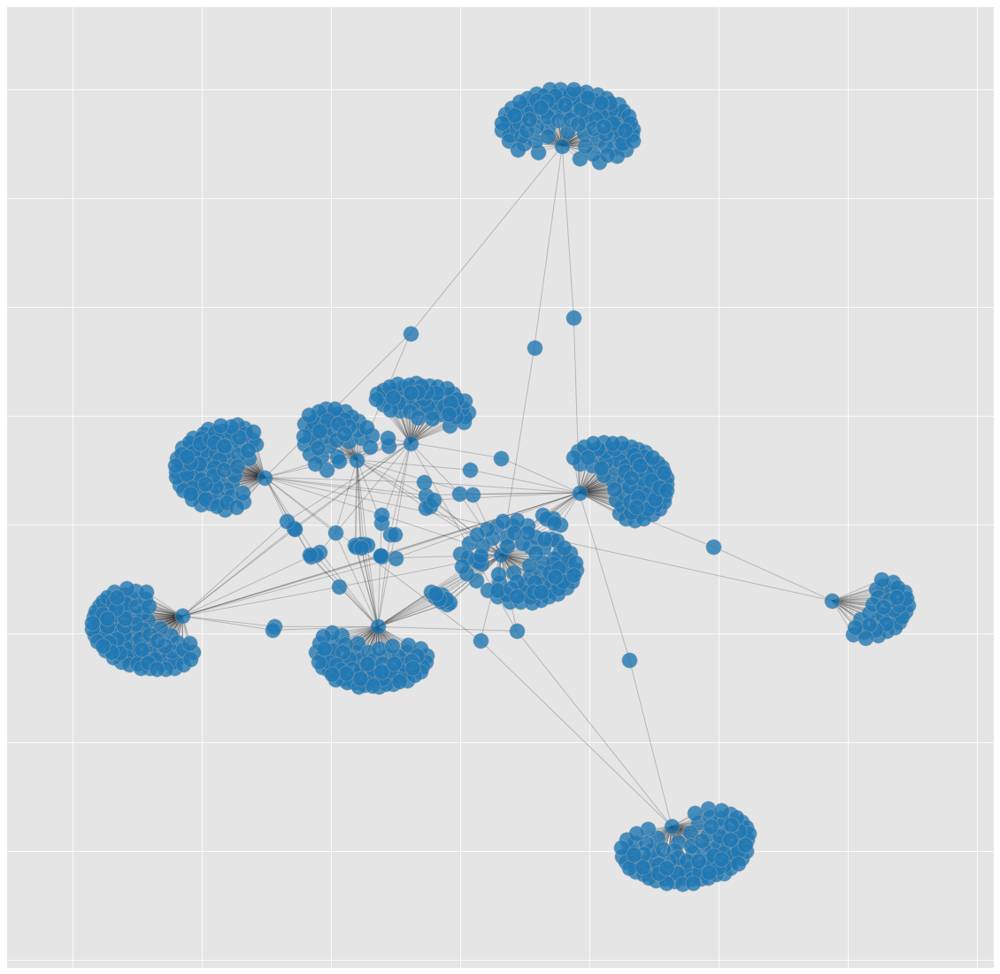

In [514]:
import matplotlib.pyplot as plt
f, ax = plt.subplots(figsize=(20, 20))
plt.style.use('ggplot')
nodes = nx.draw_networkx_nodes(G, pos, alpha=0.8)
nodes.set_edgecolor('#AAAAAA')
# nx.draw_networkx_labels(G, pos, font_size=8)
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.2)

In [512]:
G.number_of_nodes()

789

In [513]:
G.number_of_edges()

855

In [281]:
G_sorted = pd.DataFrame(sorted(G.degree, key=lambda x: x[1], reverse=True))
G_sorted.columns = ['nconst','degree']
G_sorted.head()

,nconst,degree
0,1554768110963478528,10
1,1552914113608970240,10
2,1397569068652064770,10
3,1536595291008569344,10
4,63018215,10


In [290]:
G.number_of_edges()

50

In [308]:
btw_cen=nx.betweenness_centrality(G)
btw_cen_sorted=dict(sorted(btw_cen.items(), key=lambda item: item[1], reverse=True))

In [367]:
# list(btw_cen_sorted.keys())

In [373]:
top5_btw_cen=[int(user_id) for user_id in list(btw_cen_sorted.keys())][:5]
top5_btw_cen_values=list(btw_cen_sorted.values())[:5]

In [397]:
y=pd.DataFrame(top5_btw_cen_values, columns=['betweeness_centrality'])

In [411]:
# Top5 of เด็กเดินของ
x=users[users['user_id'].isin(top5_btw_cen)][['username','user_id']].reset_index(drop=True)

In [412]:
x

,username,user_id
0,OGGANJA2,1552914113608970240
1,420RUBYWEED,1536595291008569344
2,BooK_Ku,63018215
3,Sweeddyshopv2,1567111030568001536
4,Uniprotra,1511335192589385734


In [461]:
users[users['username']=='The_Stoned_Yoda']

,username,user_id,counts


#### Data from Orn

In [ ]:
# how to remove outlier 
# how to zoom in to graph

In [518]:
df=pd.read_csv('follower_dataset.csv',skiprows=0, names=['user','follower','none']).drop('none', axis=1)

In [525]:
df[df['user']=='42xWeeD'].count()

user        63
follower    63
dtype: int64

In [523]:
df[df['user']=='The_Stoned_Yoda'].count()

user        1201
follower    1201
dtype: int64

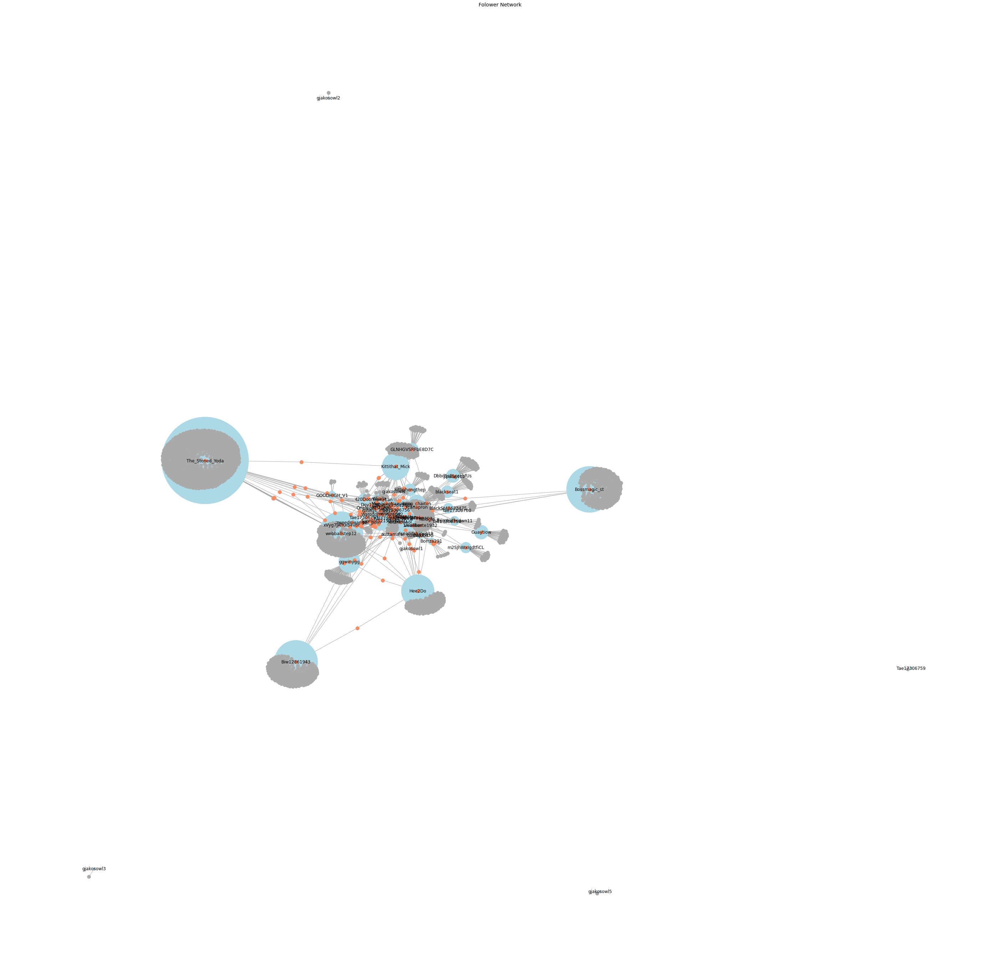

In [453]:
import matplotlib.pyplot as plt

plt.figure(figsize=(50, 50))


# 1. Create the graph
g = nx.from_pandas_edgelist(df, source='follower', target='user') 

# 2. Create a layout for our nodes 
layout = nx.spring_layout(g, seed=7)

nx.draw_networkx_edges(g, layout, edge_color='#AAAAAA')

agents = [node for node in g.nodes() if node in df.user.unique()]
# size = [g.degree(node) * 80 for node in g.nodes() if node in df.user.unique()]
size = [g.degree(node) * 50 for node in g.nodes() if node in df.user.unique()]
nx.draw_networkx_nodes(g, layout, nodelist=agents, node_size=size, node_color='lightblue')

people = [node for node in g.nodes() if node in df.follower.unique()]
#AAAAAA is grey
nx.draw_networkx_nodes(g, layout, nodelist=people, node_size=100, node_color='#AAAAAA')

high_degree_people = [node for node in g.nodes() if node in df.follower.unique() and g.degree(node) > 1]
#fc8d62 is orange
nx.draw_networkx_nodes(g, layout, nodelist=high_degree_people, node_size=100, node_color='#fc8d62')

user_dict = dict(zip(agents, agents))
nx.draw_networkx_labels(g, layout, labels=user_dict)

# 4. Turn off the axis because I know you don't want it
plt.axis('off')

plt.title("Folower Network")

# 5. Tell matplotlib to show it
plt.show()

In [515]:
agents[:10]

['The_Stoned_Yoda',
 '42xWeeD',
 'Bossmagic_st',
 'webballstep12',
 'Biw12861943',
 'Nmaprai',
 'Hee2Do',
 'Kittithat_Mick',
 'ggwinygg',
 'Soontor52153342']

In [516]:
high_degree_people[:10]

['The_Stoned_Yoda',
 'Bossmagic_st',
 'webballstep12',
 'Biw12861943',
 'Nmaprai',
 'Hee2Do',
 'Kittithat_Mick',
 'ggwinygg',
 'Soontor52153342',
 'kosin_chaiton']

### User

In [264]:
# users

In [263]:
import tweepy
user_ids = [1554768110963478528, 1552914113608970240, 1397569068652064770]

# By default, only the ID, name, and username fields of each user will be
# returned
# Additional fields can be retrieved using the user_fields parameter
response = client.get_users(ids=user_ids, user_fields=["profile_image_url"])

for user in response.data:
    print(user.username, user.profile_image_url)

42xWeeD https://pbs.twimg.com/profile_images/1561513773545861120/_MQq_DVM_normal.jpg
OGGANJA2 https://pbs.twimg.com/profile_images/1552914207619698688/TlZqBdDs_normal.jpg
nkx8yf4PxV8RccU https://pbs.twimg.com/profile_images/1571160188333494272/V9ytQPHE_normal.jpg


### Tweet

In [14]:
res = client.search_recent_tweets(query='forex3d', 
                                  user_fields=['location','description','username'],
                                  place_fields=['contained_within','country','country_code','full_name','geo','id','name','place_type'],
                                  expansions=['geo.place_id','in_reply_to_user_id','entities.mentions.username'])

In [25]:
# res

In [16]:
res.includes

{'users': [<User id=582446382 name=เจ้าแม่ Dress Code🩴มารยาทและกาลเทศะ😌 username=pompomcoffee>,
  <User id=934108905566650368 name=💖 คนหน้ามึน💖 username=naepchid>,
  <User id=1405763633410285572 name=พพชค.ชอบชัชชาติ username=pitpatchakim>,
  <User id=743415275458990085 name=in love💗 username=raspberry_tart9>,
  <User id=1542865891 name=B1 ||| username=b_B1B2B3>,
  <User id=2944197248 name=Dr Borisut Hanpanich username=DrBorisutH>,
  <User id=1570350569260449792 name=VVip username=VVip50859194>,
  <User id=1298464766 name=pls username=Mackeray>]}

In [17]:
res.data[1].get('username')

In [18]:
# res.data[6].keys()

In [26]:
for tweet in res.data[:5]:
    print(tweet.get('text'))
    print('.....')

RT @TarotYouuuu: อีดอก ประเทศกูมาถึงจุดที่ ผอ.โรงเรียนขโมยกัญชาแล้วว่ะ นิวโลว์ชิบหาย กูเวทมากกก !!!!!!! https://t.co/1tIoUc053B
.....
RT @Con1Zina: แกว่าบุหรี่มวนหรือกัญชา สูบแบบนี้ไปเลยดิ🥲 อุบาทว์ไม่ไหว #rollingloudthailand #RLThailand https://t.co/NUUyCZh6lj
.....
ได้ของดีมีคุณภาพ ราคาถูก ส่งจริง 100% ฝากติดตาม ฝากร้านเล็กๆด้วยนะคะ แค่เปิดใจลอง ขอบคุณที่ไว้วางใจ 🥰🙏

#กัญชาเชียงใหม่ #ogเชียงใหม่ #cannabischiangmai #ดอกog #weedchiangmai  #กัญชาออแกนิค #กัญชาog #ดอกหางกระรอก #กัญชา https://t.co/AqQpmbSKi8
.....
555555555 มีคนบอกแดรกกัญชาแร้วอารมดีแม่กุบอกจะเอาไปฝากเจ้าหน้าที่รัฐที่ทำงานบริการปชชจะได้เลิกเหวี่ยง555555555555
.....
RT @SPRiNGNEWS_TH: รัฐบาลแจง แม้ พ.ร.บ.กัญชา กัญชง ยังไม่มีผลบังคับ แต่มีกฎหมายควบคุมการใช้ให้เหมาะสมเพียงพอ และควบคุมอย่างรอบด้าน #SPRiNG…
.....
RT @lalalin_lala: แต่อิแจกเครื่องดืมผสมกัญชาคือแบบ…มาก คือตอนแรกเราก็หยิบมาเพราะคนแจกไม่บอกน้ำอะไร บอกแต่หยิบได้เลย แจกฟรี เรากับเพื่อนก็ห…
.....
RT @egg_family4: ด่วน!!! พบแก๊งวัยรุ่นมั่วสุมกัญชาแมว 

(ตำแยแมว) https:

In [28]:
def from_days(today, days):
    return today-timedelta(days=days)

In [29]:
# tweet from user
now=datetime.utcnow()

start=from_days(now, 1)
end=now-timedelta(minutes=1) 

start=start.strftime('%Y-%m-%dT%H:%M:%SZ')
end=end.strftime('%Y-%m-%dT%H:%m:%SZ')

print(start, end)

res = client.search_recent_tweets(query='กัญชา',max_results=100, start_time=start, end_time=end)

2022-09-17T03:45:47Z 2022-09-18T03:09:47Z


In [30]:
# res

In [31]:
for tweet in res.data[:5]:
    print(tweet.get('text'))
    print('...')

RT @egg_family4: ด่วน!!! พบแก๊งวัยรุ่นมั่วสุมกัญชาแมว 

(ตำแยแมว) https://t.co/VTK3hJbDdY
...
RT @prachatai: ภูมิใจไทยหน้าบาน สภาผ่านร่าง พ.ร.บ.กองทุนเงินให้กู้ยืมเพื่อการศึกษา
.
แต่ไม่กี่ชั่วโมง ภูมิใจไทยต้องเดือดดาล ประชาธิปัตย์เสน…
...
RT @Offchainon: บุรีรัมย์จัดหาต้นกัญชา 1,000 ต้นมาเก็บไว้ เพื่อเตรียมเอาไว้โชว์ในโมโตจีพี 

จู่ๆ มีคนขับรถมายกต้นกัญชา 1 ต้น ขึ้นรถไปเฉยเลย…
...
RT @egg_family4: ด่วน!!! พบแก๊งวัยรุ่นมั่วสุมกัญชาแมว 

(ตำแยแมว) https://t.co/VTK3hJbDdY
...
RT @TarotYouuuu: อีดอก ประเทศกูมาถึงจุดที่ ผอ.โรงเรียนขโมยกัญชาแล้วว่ะ นิวโลว์ชิบหาย กูเวทมากกก !!!!!!! https://t.co/1tIoUc053B
...
RT @Con1Zina: แกว่าบุหรี่มวนหรือกัญชา สูบแบบนี้ไปเลยดิ🥲 อุบาทว์ไม่ไหว #rollingloudthailand #RLThailand https://t.co/NUUyCZh6lj
...
ได้ของดีมีคุณภาพ ราคาถูก ส่งจริง 100% ฝากติดตาม ฝากร้านเล็กๆด้วยนะคะ แค่เปิดใจลอง ขอบคุณที่ไว้วางใจ 🥰🙏

#กัญชาเชียงใหม่ #ogเชียงใหม่ #cannabischiangmai #ดอกog #weedchiangmai  #กัญชาออแกนิค #กัญชาog #ดอกหางกระรอก #กัญชา https://t.co/AqQpmbSKi8
...
555555555 มี

## Network Analysis

In [5]:
!ls

1_introduction.ipynb              marijuana_20220906.csv
2_alogorithm.ipynb                marijuana_20220918.csv
3_path.ipynb                      marijuana_notebook.ipynb
Network-Analysis-Made-Simple      marijuana_user_tweet_20220906.csv
all_follower_tier1.csv            marijuana_user_tweet_20220918.csv
all_follower_tier2.csv            raw_network.png
class_notebook                    text mining
follower_dataset.csv              twint
follower_network.csv


In [106]:
agent_df=pd.read_csv('marijuana_user_tweet_20220906.csv', index_col=None, header=0)

In [58]:
df=pd.read_csv('follower_network.csv', index_col=None, header=0)

### Data Analysis

In [26]:
df[['source_name','follower_name']].to_csv("follower_network_cut.csv",index=False, header=None)

In [27]:
df[['source_name','follower_name']].shape

(10192, 2)

In [210]:
# drop duplicated data
df2=df[['source_name','follower_name']].drop_duplicates()

In [10]:
agent_df.head()

,username,user_id,counts
0,42xWeeD,1554768110963478528,495
1,BooK_Ku,63018215,139
2,OGGANJA2,1552914113608970240,129
3,nkx8yf4PxV8RccU,1397569068652064770,118
4,zoromonsS,1454486461269434373,110


In [211]:
G=nx.from_pandas_edgelist(df2, 'source_name', 'follower_name') 

In [212]:
G.number_of_nodes()

7566

In [213]:
G.number_of_edges()

9554

In [214]:
sorted(dict(G.degree()).items(), key=lambda x:x[1], reverse=True)[0:5]

[('greenyard4420', 272),
 ('Stoner__Weed', 237),
 ('ZC8EbZI8zsdKnGQ', 212),
 ('webballstep12', 210),
 ('Thailand2590', 202)]

In [218]:
agent_df[agent_df['username']=='Stoner__Weed']

,username,user_id,counts
19,Stoner__Weed,1495303418113855489,37


In [276]:
df[(df['source_name']=='BooK_Ku')].shape

(200, 6)

In [277]:
df[(df['follower_name']=='BooK_Ku')].shape

(0, 6)

In [233]:
follower_count_df=df2.groupby(['source_name']).count().sort_values('follower_name').reset_index().rename(columns={'source_name':'username','follower_name':'follower_count'})

In [235]:
following_count_df=df2.groupby(['follower_name']).count().sort_values('source_name').reset_index().rename(columns={'follower_name':'username','source_name':'following_count'})

In [263]:
following_count_df[(following_count_df['username']=='nkx8yf4PxV8RccU')]

,username,following_count


In [240]:
follower_count_df.shape, following_count_df.shape

((172, 2), (7559, 2))

In [237]:
follower_count_df.tail()

,username,follower_count
167,nkx8yf4PxV8RccU,200
168,GUEST6607526277,200
169,ZC8EbZI8zsdKnGQ,200
170,t_skyper,200
171,Thailand2590,200


In [238]:
following_count_df.tail()

,username,following_count
7554,3hzee,29
7555,Seven9z,31
7556,Stoner__Weed,38
7557,THELEGENDOFFIC,39
7558,greenyard4420,82


In [173]:
# pd.merge(follower_count_df, following_count_df, how="right", on=["username"])

In [241]:
follower_count_df[follower_count_df['username'].isin(['zoromonsS','nkx8yf4PxV8RccU'])]

,username,follower_count
109,zoromonsS,36
167,nkx8yf4PxV8RccU,200


In [242]:
following_count_df[following_count_df['username'].isin(['zoromonsS','nkx8yf4PxV8RccU'])]

,username,following_count


In [271]:
df3=pd.merge(following_count_df, follower_count_df, how="outer", on=["username"]).fillna(0)

In [272]:
df3.head()

,username,following_count,follower_count
0,001Bravo1,1.0,0.0
1,hrrsk1,1.0,0.0
2,hrphthrphthywn1,1.0,0.0
3,hrphthrchtid1,1.0,0.0
4,hrdxsmbrkic1,1.0,0.0


In [323]:
df3[df3['username']=='Stoner__Weed']

,username,following_count,follower_count
7556,Stoner__Weed,38.0,200.0


In [333]:
# คนขายแน่ๆ behaviour จัดๆ
df3[(df3['follower_count']==df3['follower_count'].max()) & (df3['following_count']==df3['following_count'].min())].reset_index(drop=True)

,username,following_count,follower_count
0,smokequeen89,0.0,200.0
1,BooK_Ku,0.0,200.0
2,nkx8yf4PxV8RccU,0.0,200.0
3,GUEST6607526277,0.0,200.0


In [283]:
agent_follower_count_df=pd.merge(agent_df, df3, how="left", on=["username"])

In [284]:
agent_follower_count_df.head()

,username,user_id,counts,following_count,follower_count
0,42xWeeD,1554768110963478528,495,0.0,65.0
1,BooK_Ku,63018215,139,0.0,200.0
2,OGGANJA2,1552914113608970240,129,3.0,56.0
3,nkx8yf4PxV8RccU,1397569068652064770,118,0.0,200.0
4,zoromonsS,1454486461269434373,110,0.0,36.0


In [330]:
agent_follower_count_df[agent_follower_count_df['username'].isin(['greenyard4420','Stoner__Weed'])]

,username,user_id,counts,following_count,follower_count
19,Stoner__Weed,1495303418113855489,37,38.0,200.0
91,greenyard4420,1559048834852220928,13,82.0,200.0


In [334]:
agent_follower_count_df[(agent_follower_count_df['follower_count']==df3['follower_count'].max()) & (agent_follower_count_df['following_count']==df3['following_count'].min())]

,username,user_id,counts,following_count,follower_count
1,BooK_Ku,63018215,139,0.0,200.0
3,nkx8yf4PxV8RccU,1397569068652064770,118,0.0,200.0
6,GUEST6607526277,1183085379202633728,91,0.0,200.0
7,smokequeen89,1551239508720422918,61,0.0,200.0


In [304]:
# ตัวจริง Agent
df4=agent_follower_count_df[(agent_follower_count_df['follower_count']==agent_follower_count_df['follower_count'].max())]

In [322]:
# ตัวจริงจริง Agent
agent_follower_count_df[agent_follower_count_df.sort_values('counts',ascending=False).head(10).isin(df4.username)]['username'].dropna()

1            BooK_Ku
3    nkx8yf4PxV8RccU
6    GUEST6607526277
7       smokequeen89
9           tuatoh29
Name: username, dtype: object

### Graph Analysis

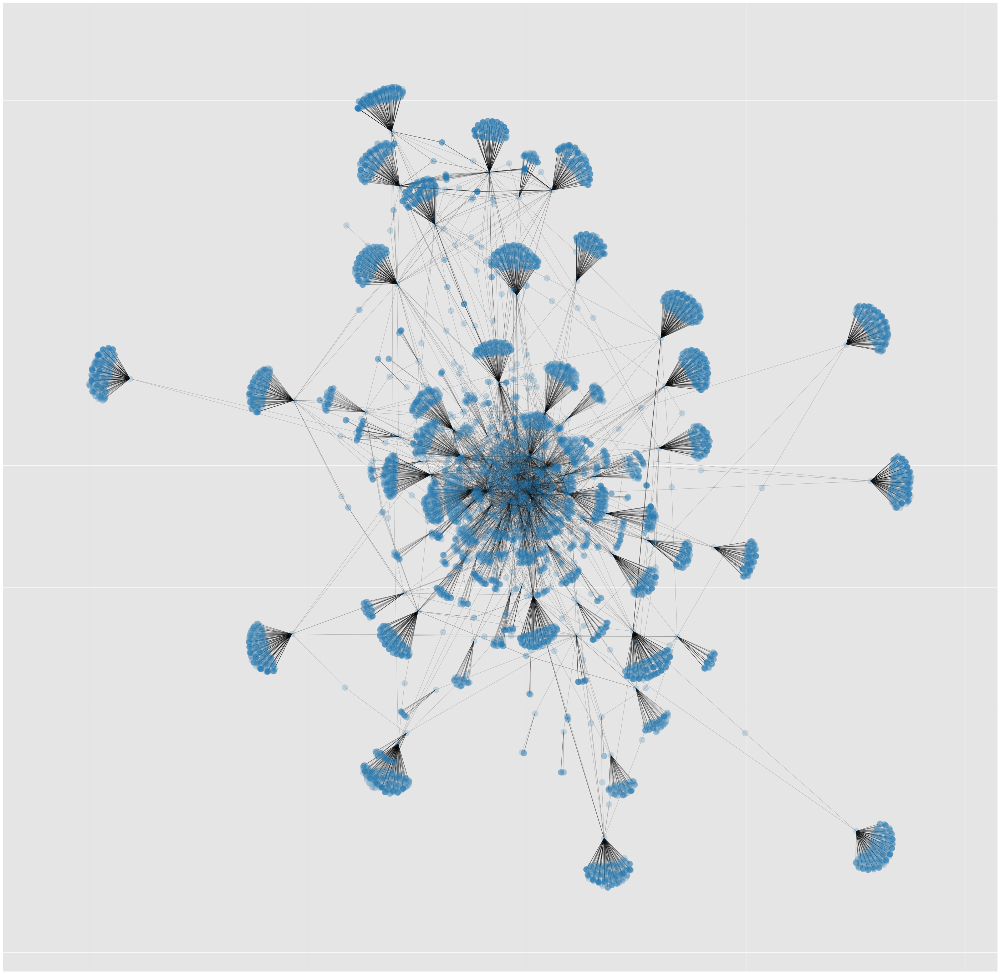

In [99]:
pos = nx.spring_layout(G) 
f, ax = plt.subplots(figsize=(50, 50))
plt.style.use('ggplot')
nodes = nx.draw_networkx_nodes(G, pos, alpha=0.2)
nodes.set_edgecolor('#AAAAAA')
# nx.draw_networkx_labels(G, pos, font_size=1)
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.2)
plt.savefig('raw_network.png', bbox_inches='tight')
plt.show()

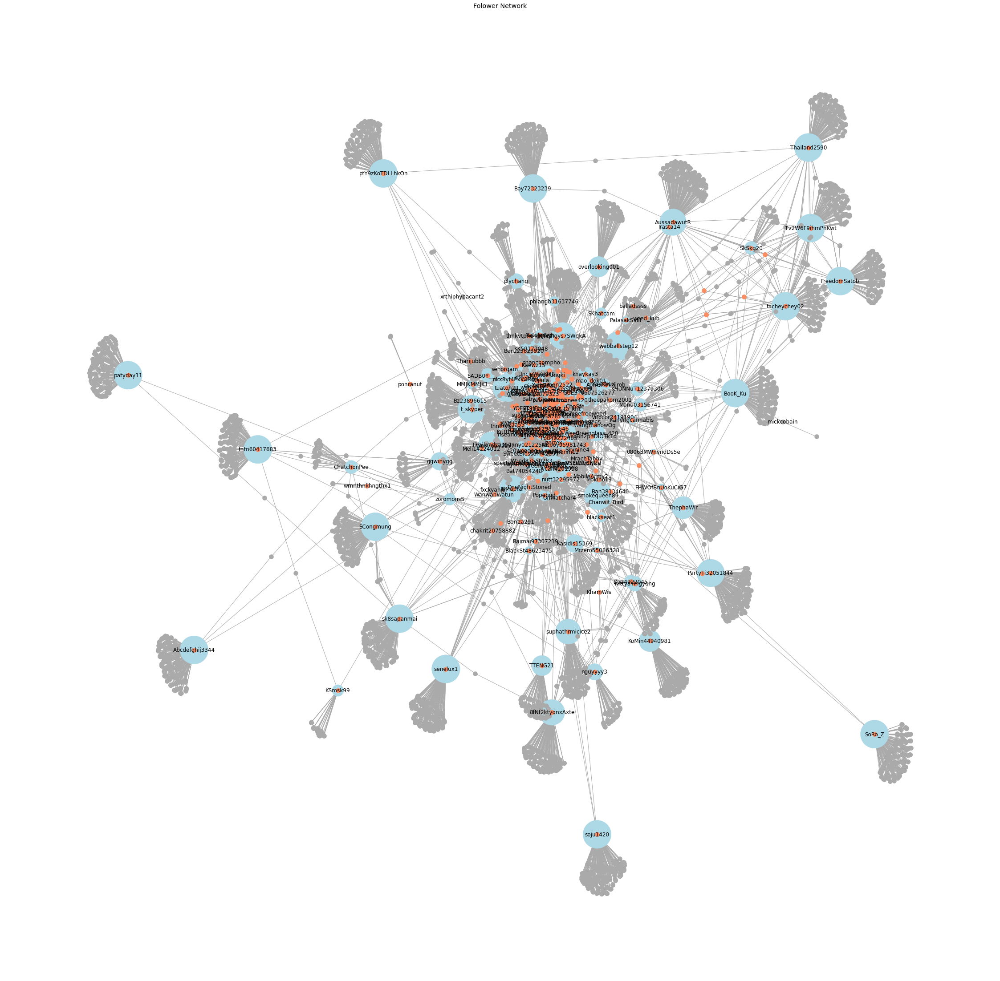

In [10]:
import matplotlib.pyplot as plt

f, ax = plt.subplots(figsize=(40, 40))

g = nx.from_pandas_edgelist(df, 'source_name', 'follower_name') 
pos = nx.spring_layout(G, seed=5) 

nx.draw_networkx_edges(g, pos, edge_color='#AAAAAA')
agents = [node for node in g.nodes() if node in df.source_name.unique()]
# size = [g.degree(node) * 80 for node in g.nodes() if node in df.user.unique()]
size = [g.degree(node) * 20 for node in g.nodes() if node in df.source_name.unique()]
nx.draw_networkx_nodes(g, pos, nodelist=agents, node_size=size, node_color='lightblue')

people = [node for node in g.nodes() if node in df.follower_name.unique()] 
nx.draw_networkx_nodes(g, pos, nodelist=people, node_size=100, node_color='#AAAAAA') #AAAAAA is grey

high_degree_people = [node for node in g.nodes() if node in df.follower_name.unique() and g.degree(node) > 3]
nx.draw_networkx_nodes(g, pos, nodelist=high_degree_people, node_size=100, node_color='#fc8d62') #fc8d62 is orange

user_dict = dict(zip(agents, agents))
nx.draw_networkx_labels(g, pos, labels=user_dict)

plt.axis('off')
plt.title("Folower Network")

plt.show()

In [78]:
# nx.transitivity(G)

In [57]:
partition = nx_comm.louvain_communities(G)

In [59]:
partition = community_louvain.best_partition(G)

In [66]:
# partition.items()

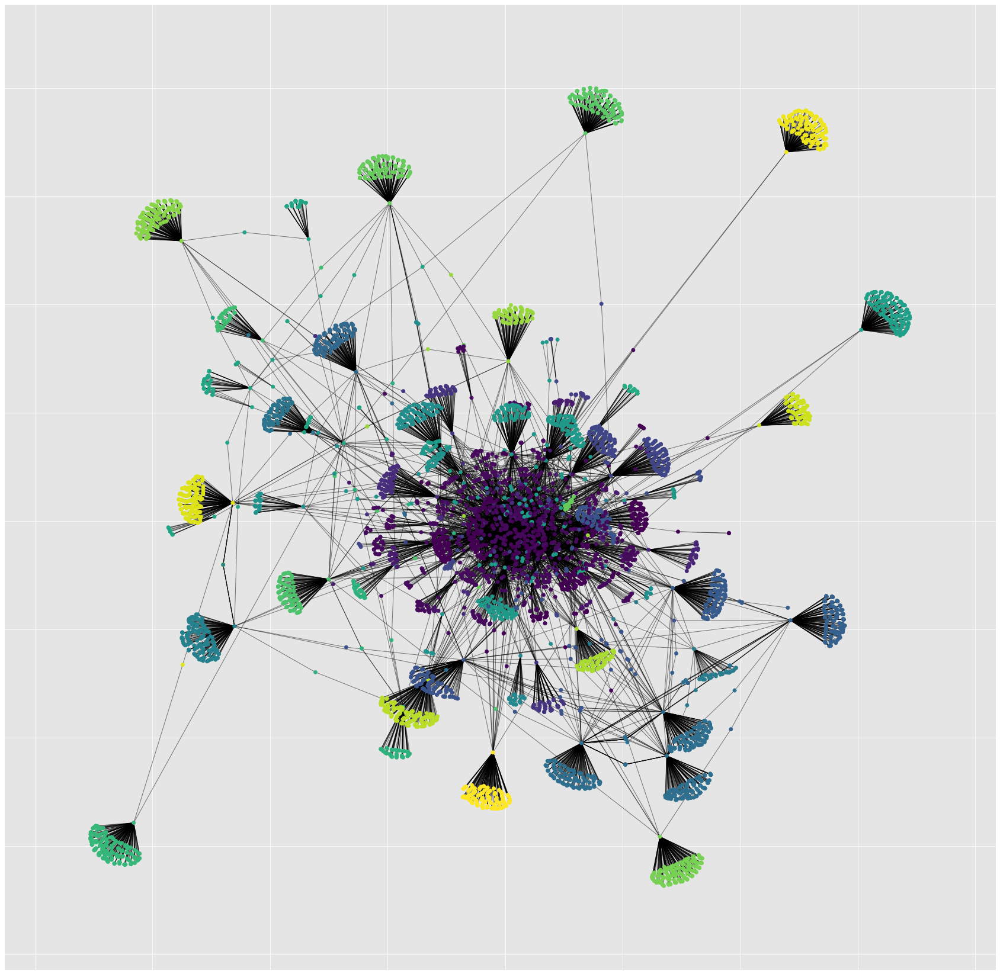

In [91]:
f, ax = plt.subplots(figsize=(50, 50))
pos = nx.spring_layout(G)
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40, cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.savefig('louvain_communities.png', bbox_inches='tight')
plt.show()

In [68]:
partition1 = pd.DataFrame([partition]).T
partition1 = partition1.reset_index()
partition1.columns = ['username','group']

In [70]:
partition1.head()

,username,group
0,42xWeeD,0
1,C9xMggNjYe4e6GI,0
2,Benz23625920,1
3,Doy1237,0
4,HighBerHerb420,2


In [77]:
# 40 groups detected
partition1['group'].unique().shape

(40,)

In [79]:
closeness = nx.closeness_centrality(G)
sorted(closeness.items(), key=lambda x:x[1], reverse=True)[0:5]

[('greenyard4420', 0.34593927199561003),
 ('Stoner__Weed', 0.32990275173346123),
 ('Sweeddyshopv2', 0.32544633254463323),
 ('webballstep12', 0.3252224753879885),
 ('THELEGENDOFFIC', 0.32520849454045225)]

In [81]:
betweenness = nx.betweenness_centrality(G)
sorted(betweenness.items(), key=lambda x:x[1], reverse=True)[0:5]

[('greenyard4420', 0.19950439180252322),
 ('zoromonsS', 0.14772919815913604),
 ('BooK_Ku', 0.14352610909566274),
 ('webballstep12', 0.1127292696071033),
 ('smokequeen89', 0.1055423542396213)]

In [16]:
degreeness = nx.degree_centrality(G)
sorted(degreeness.items(), key=lambda x:x[1], reverse=True)[0:5]

[('greenyard4420', 0.035955056179775284),
 ('Stoner__Weed', 0.031328486450760085),
 ('ZC8EbZI8zsdKnGQ', 0.028023793787177793),
 ('webballstep12', 0.02775941837409121),
 ('Thailand2590', 0.02670191672174488)]

In [394]:
eigenesss = nx.eigenvector_centrality(G)
sorted(eigenesss.items(), key=lambda x:x[1], reverse=True)[0:5]

[('greenyard4420', 0.34892973008281747),
 ('Stoner__Weed', 0.2733743407202733),
 ('ZC8EbZI8zsdKnGQ', 0.2572977596086836),
 ('webballstep12', 0.16519585826088987),
 ('nkx8yf4PxV8RccU', 0.1529169585235359)]

In [ ]:
eigenesss = nx.pagerank(G)
sorted(eigenesss.items(), key=lambda x:x[1], reverse=True)[0:5]

In [88]:
agent_df[:10]

,username,user_id,counts
0,42xWeeD,1554768110963478528,495
1,BooK_Ku,63018215,139
2,OGGANJA2,1552914113608970240,129
3,nkx8yf4PxV8RccU,1397569068652064770,118
4,zoromonsS,1454486461269434373,110
5,Greenglass_420,1557614780864536576,103
6,GUEST6607526277,1183085379202633728,91
7,smokequeen89,1551239508720422918,61
8,420weedog,1559885381654327297,60
9,tuatoh29,1536099003556696065,58


In [73]:
agent_df[agent_df['username']=='greenyard4420']

,username,user_id,counts
91,greenyard4420,1559048834852220928,13


In [29]:
g.degree('nkx8yf4PxV8RccU')

200

In [36]:
seller_df=df[df['source_name']=='nkx8yf4PxV8RccU']

In [37]:
k = G.subgraph(seller_df)

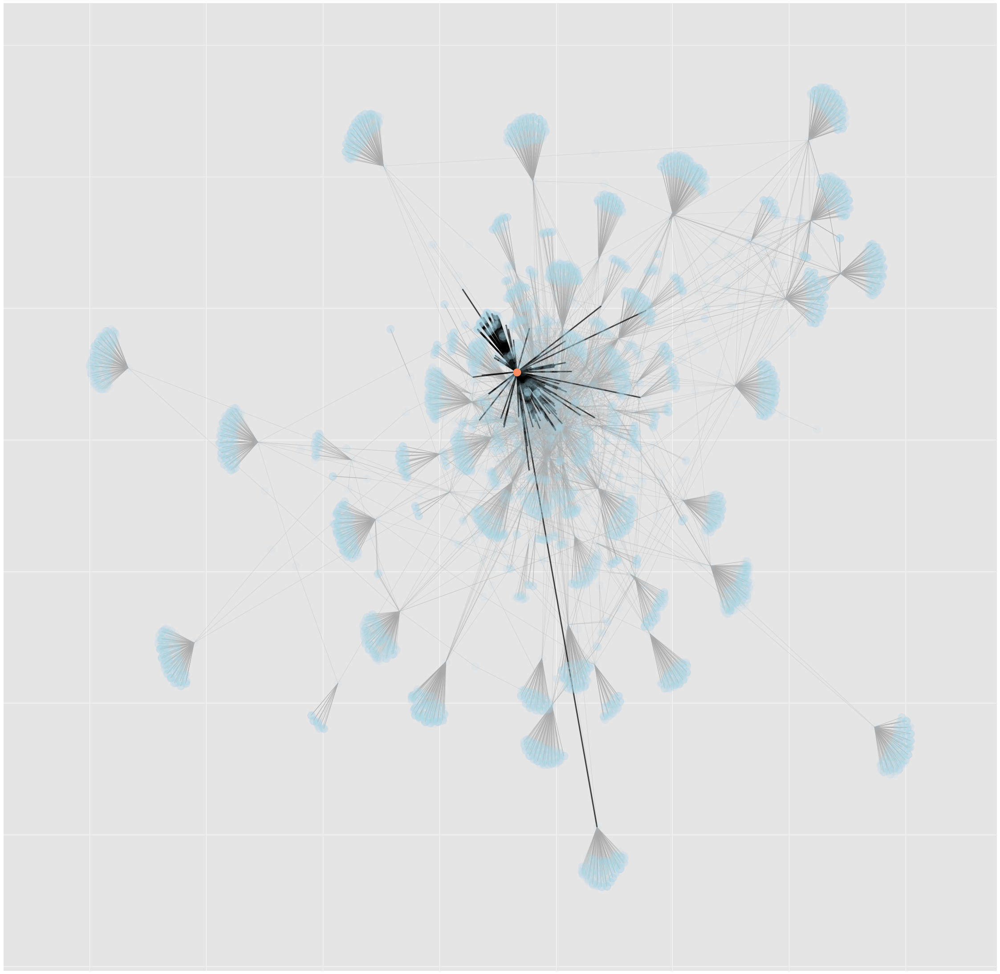

In [331]:
f, ax = plt.subplots(figsize=(40, 40))
plt.style.use('ggplot')

g=nx.from_pandas_edgelist(df, 'source_name', 'follower_name') 
sg=nx.from_pandas_edgelist(seller_df, 'source_name', 'follower_name') 
pos=nx.spring_layout(G, seed=5) 

nx.draw_networkx_edges(g, pos, edge_color='#AAAAAA', alpha=0.3)
nx.draw_networkx_nodes(g, pos, node_color='lightblue', alpha=0.1)
nx.draw_networkx_edges(sg, pos, edge_color='black', width=3.0, alpha=0.7)
nx.draw_networkx_nodes(sg, pos, nodelist=['nkx8yf4PxV8RccU'], node_color = '#fc8d62')

plt.show()

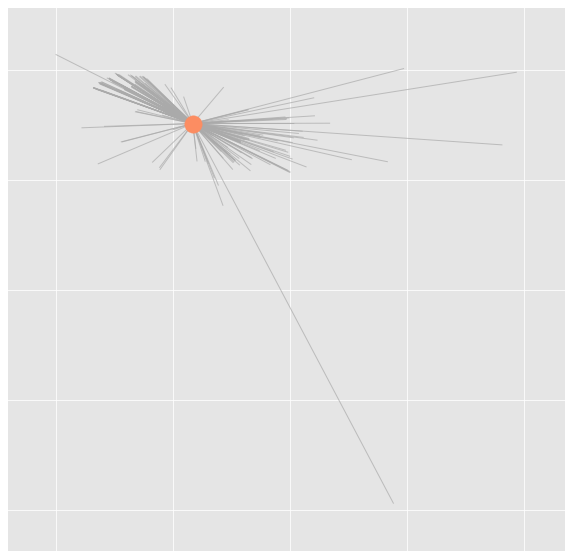

In [278]:
f, ax = plt.subplots(figsize=(10, 10))
plt.style.use('ggplot')
nx.draw_networkx_edges(sg, pos, edge_color='#AAAAAA', width=1.0, alpha=0.7)
nx.draw_networkx_nodes(sg, pos, nodelist=['nkx8yf4PxV8RccU'], node_color = '#fc8d62')

In [356]:
import numpy as np
from scipy.sparse import csc_matrix
from numpy import linalg as LA

In [350]:
A=np.identity(5)

In [374]:
a=csc_matrix([[1, 0, 0, 1], [0, 0, 1, 1], [0, 0, 0, 1], [1, 1, 1, 1]])

In [388]:
a.todense()

matrix([[1, 0, 0, 1],
        [0, 0, 1, 1],
        [0, 0, 0, 1],
        [1, 1, 1, 1]])

In [389]:
a

<4x4 sparse matrix of type '<class 'numpy.int64'>'
	with 9 stored elements in Compressed Sparse Column format>

In [382]:
b=np.array([[1, -1], [1, 1]])

In [386]:
b

array([[ 1, -1],
       [ 1,  1]])

In [390]:
w, v = LA.eig(a.todense())

In [391]:
w

array([ 2.56811486+0.j        ,  0.7759186 +0.j        ,
       -0.67201673+0.22413898j, -0.67201673-0.22413898j])

In [392]:
v

matrix([[-0.46872648+0.j        , -0.79795319+0.j        ,
          0.29220338-0.05579378j,  0.29220338+0.05579378j],
        [-0.39765578+0.j        ,  0.5274411 +0.j        ,
         -0.24021677-0.31639724j, -0.24021677+0.31639724j],
        [-0.28620875+0.j        ,  0.23044488+0.j        ,
          0.70841002+0.j        ,  0.70841002-0.j        ],
        [-0.73501695+0.j        ,  0.17880647+0.j        ,
         -0.47606339+0.1587823j , -0.47606339-0.1587823j ]])

In [393]:
w, v = LA.eig(b)